## Download data from Google Drive
#### Install `driveanon` package

In [3]:
 #!pip install -q git+https://github.com/friedrichknuth/driveanon.git

In [4]:
import driveanon

#### Check folder content
This is the url to our Google Drive data directory called ASO_LiDAR_TIFs  
https://drive.google.com/drive/folders/18RBI_SmsowSNbZnmtP2S-xWeWEId7-bm?usp=sharing  
Notice the random string of characters that we will call the `folder_blob_id`  

In [5]:
folder_blob_id = '18RBI_SmsowSNbZnmtP2S-xWeWEId7-bm'
file_names, file_blob_ids = driveanon.list_blobs(folder_blob_id,
                                          '.tif',
                                          )

In [6]:
file_names

['ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif',
 'ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif',
 'ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif',
 'ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif']

In [7]:
file_blob_ids

['1Dgy2hOkUPZjbtEDiS6imnHAZg0IFR5Zy',
 '1YnZDpGMpn_dd7XYMoQ4T6PdFR_1TJAV6',
 '1EeGyUG7dSH5AGa6WzFmKGZ6YhkxDmYRP',
 '12jhMafrXHnoD3YLWtQRPWMSIi2an9kEz']

#### Save files to disk
Next let's iterate over the `file_names` list and use driveanon to save the files to disk.

In [14]:
for blob_id in file_blob_ids:
     driveanon.save(blob_id)

#### Let's see what we got.

In [15]:
! ls -al

total 433668
drwxrwsr-x  5 jovyan users      4096 Jul 16 17:15 .
drwxrwsr-x 14 jovyan users      4096 Jul 16 16:29 ..
-rw-r--r--  1 jovyan users 106934192 Jul 16 17:15 ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif
-rw-r--r--  1 jovyan users 106934192 Jul 16 17:15 ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif
-rw-r--r--  1 jovyan users 106941102 Jul 16 17:15 ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif
-rw-r--r--  1 jovyan users 106941102 Jul 16 17:15 ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif
-rw-r--r--  1 jovyan users   6546568 Jul 16 17:14 dem_plotting_and_differencing_AJ.ipynb
drwxrwsr-x  2 jovyan users      4096 Jul 16 04:01 .empty
drwxrwsr-x  2 jovyan users      4096 Jul 16 17:14 .ipynb_checkpoints
-rw-rw-r--  1 jovyan users     77465 Jul 16 04:27 Jewel_SnowTemps-AJ.ipynb
-rw-rw-r--  1 jovyan users    118890 Jul 16 16:49 Jewel_SnowTemps.ipynb
-rw-r--r--  1 jovyan users   9495479 Jul 16 16:49 Jewel_SnowTemps_RA.ipynb
drwxrwsr-x  2 jovyan users      4096 Jul 

#### Create data directory and move files there

In [10]:
# ! mkdir data

In [18]:
! mv ASO*.tif data/

In [12]:
# ! ls -al data/

## Data wrangling

#### Inspect the metadata for the `tif` files

In [20]:
! gdalinfo data/ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif
! gdalinfo data/ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif
! gdalinfo data/ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif
! gdalinfo data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif


Driver: GTiff/GeoTIFF
Files: data/ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif
Size is 7576, 3528
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 12N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 12N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-111,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",500000,
            LENGTHUNIT["metre",1],
  

#### Looks like these tif files do not have a no data value defined. Let's fix that. (I inspected the data array and see that the nodata value is -9999)

In [21]:
import glob

In [22]:
tif_files = sorted(glob.glob('data/*.tif'))
tif_files

['data/ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif',
 'data/ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif']

In [24]:
#for file_name in tif_files:
#    ! gdal_edit.py -a_nodata -9999 {file_name}

In [25]:
! gdalinfo data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif

Driver: GTiff/GeoTIFF
Files: data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif
Size is 7576, 3528
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 12N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 12N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-111,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",500000,
            LENGTHUNIT["metre",1]

#### That's better. The nodata value is now defined (see end of output above). We want to define this so that software like `rasterio` automatically knows which values to mask out when plotting.

## Plotting

In [26]:
import os
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import numpy as np

#### Read one of the raster files

In [27]:
tif_files

['data/ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif',
 'data/ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif']

In [28]:
src = rasterio.open(tif_files[0],masked=True)
src = rasterio.open(tif_files[1],masked=True)
src = rasterio.open(tif_files[2],masked=True)
src = rasterio.open(tif_files[3],masked=True)

#### Check min and max value
We want to know the min and max values in the raster array so that we can set the colorbar limits accordingly.   
I am importing a custom function from my `tools.py` file in my directory.   
The autoreload commands enable making changes to `tools.py` which will be automatically loaded into the running notebook, without restarting the notebook.   

In [29]:
%load_ext autoreload
%autoreload 2

In [31]:
import tools

In [32]:
# read in data array
array = src.read(1)
# replace nodata value with nan
array = tools.replace_and_fill_nodata_value(array, src.nodata, np.nan)


In [33]:
print('min elevation:', np.nanmin(array))
print('max elevation:', np.nanmax(array))

min elevation: 2292.369
max elevation: 3323.4192


#### Plot with `show` command and modify with `matplotlib`
See list of matplotlib colormaps here https://matplotlib.org/stable/tutorials/colors/colormaps.html  

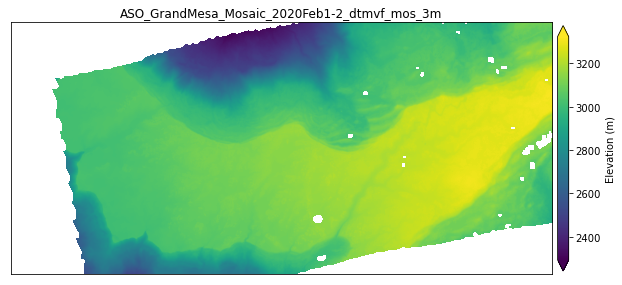

In [34]:
cmap = 'viridis'
vmin = np.nanmin(array)
vmax = np.nanmax(array)

fig,ax = plt.subplots(figsize=(10,5))

show(src, 
     ax=ax,
     cmap=cmap,
     vmin = vmin,
     vmax = vmax)

sm = plt.cm.ScalarMappable(cmap=cmap,
                               norm=plt.Normalize(vmin = vmin, 
                                                  vmax = vmax))
cbar = fig.colorbar(sm, 
                    ax=ax,
                    pad=0.01,
                    extend='both',
                    fraction=0.02)

cbar.set_label(label='Elevation (m)')

ax.set_xticks(())
ax.set_yticks(())

title = tif_files[0].split('/')[-1].split('.')[0]
ax.set_title(title);

#### Create custom colormap range

In [35]:
import matplotlib.colors as colors

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

In [36]:
cmap = plt.get_cmap('viridis')
cmap_new = truncate_colormap(cmap, minval=0.3, maxval=0.9, n=100)

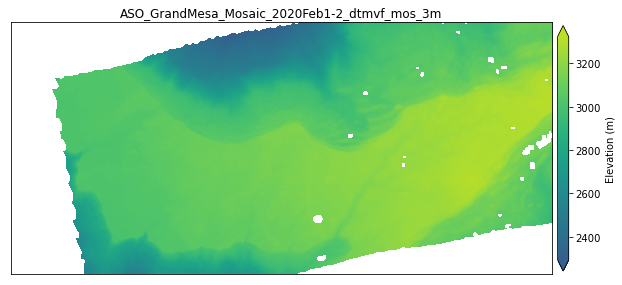

In [37]:
fig,ax = plt.subplots(figsize=(10,5))

show(src, 
     ax=ax,
     cmap=cmap_new,
     vmin = vmin,
     vmax = vmax)

sm = plt.cm.ScalarMappable(cmap=cmap_new,
                               norm=plt.Normalize(vmin = vmin, 
                                                  vmax = vmax))
cbar = fig.colorbar(sm, 
                    ax=ax,
                    pad=0.01,
                    extend='both',
                    fraction=0.02)

cbar.set_label(label='Elevation (m)')

ax.set_xticks(())
ax.set_yticks(())

title = tif_files[0].split('/')[-1].split('.')[0]
ax.set_title(title);

## Add basemap
Use `contextily`

In [38]:
import contextily as ctx

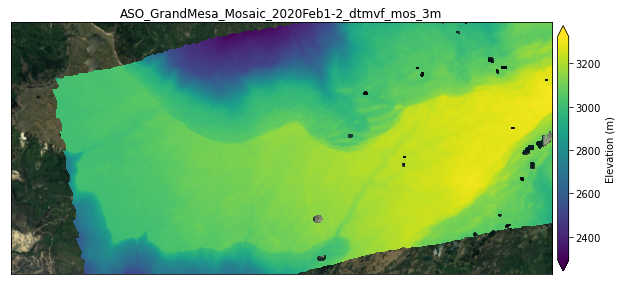

In [39]:
fig,ax = plt.subplots(figsize=(10,5))

show(src, 
     ax=ax,
     cmap=cmap,
     vmin = vmin,
     vmax = vmax,
     alpha=1)

sm = plt.cm.ScalarMappable(cmap=cmap,
                               norm=plt.Normalize(vmin = vmin, 
                                                  vmax = vmax))
cbar = fig.colorbar(sm, 
                    ax=ax,
                    pad=0.01,
                    extend='both',
                    fraction=0.02)

cbar.set_label(label='Elevation (m)')

ax.set_xticks(())
ax.set_yticks(())

title = tif_files[0].split('/')[-1].split('.')[0]
ax.set_title(title)

ctx.add_basemap(ax, 
                crs = src.crs,
                zorder=-1,
                source = "https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}")

## Make interactive map

In [40]:
import xarray as xr
import geoviews as gv
import hvplot
import hvplot.xarray

import warnings
warnings.filterwarnings('ignore')

In [41]:
da = xr.open_rasterio(src)
da.values = tools.replace_and_fill_nodata_value(da.values, src.nodata, np.nan)

In [42]:
img = da.sel(band=1).hvplot.image(rasterize=True,
                                  cmap='viridis',
                                  geo=True)

In [43]:
url   = 'https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}'
tiles = gv.WMTS(url)

In [44]:
img * tiles

:DynamicMap   []
   :Overlay
      .Image.I :Image   [x,y]   (value)
      .WMTS.I  :WMTS   [Longitude,Latitude]

#### Create custom colormap range

In [45]:
import matplotlib.colors as colors

def truncate_colormap_for_hvplot(cmap, minpercent=0.0, maxpercent=1.0):
    color_value_count = len(cmap.colors)
    lower_bound = int(color_value_count * minpercent)
    upper_bound = int(color_value_count * maxpercent)
    cmap_new = [colors.to_hex(x) for x in cmap.colors[lower_bound:upper_bound]]
    
    return cmap_new

In [46]:
cmap = plt.get_cmap('viridis')
cmap_new = truncate_colormap_for_hvplot(cmap, minpercent=0.3, maxpercent=0.9)

In [47]:
img = da.sel(band=1).hvplot.image(rasterize=True,
                                  cmap=cmap_new,
                                  geo=True)

In [48]:
img * tiles

:DynamicMap   []
   :Overlay
      .Image.I :Image   [x,y]   (value)
      .WMTS.I  :WMTS   [Longitude,Latitude]

## Difference with snow free DEM
Use `rioxarray`

In [49]:
import rioxarray

In [50]:
tif_files

['data/ASO_GrandMesa_Mosaic_2020Feb1-2_dtmvf_mos_3m.tif',
 'data/ASO_GrandMesa_Mosaic_2020Feb1-2_fsrdemvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_dtmvf_mos_3m.tif',
 'data/ASO_snowfree_GrandMesa_2016Sep26_fsrdemvf_mos_3m.tif']

In [51]:
snow_on = xr.open_dataarray(tif_files[0],engine='rasterio')
snow_off = xr.open_dataarray(tif_files[2],engine='rasterio')

In [52]:
snow_on_match = snow_on.rio.reproject_match(snow_off)
snow_on_match = snow_on_match.assign_coords({
    "x": snow_off.x,
    "y": snow_off.y,
})

In [53]:
snow_on_match.values.shape == snow_off.values.shape

True

In [54]:
difference_array = snow_on_match.values - snow_off.values

In [55]:
difference_da = xr.full_like(da, 1)
difference_da.values = difference_array

In [56]:
img = difference_da.sel(band=1).hvplot.image(rasterize=True,
                                             cmap='Blues',
                                             geo=True,
                                             clim=(0,1))

In [58]:
img * tiles

:DynamicMap   []
   :Overlay
      .Image.I :Image   [x,y]   (value)
      .WMTS.I  :WMTS   [Longitude,Latitude]

In [62]:
difference_da.rio.to_raster("diff-snowdepth.tif")


In [69]:
!gdalinfo diff-snowdepth.tif

Driver: GTiff/GeoTIFF
Files: diff-snowdepth.tif
Size is 7576, 3528
Coordinate System is:
PROJCRS["WGS 84 / UTM zone 12N",
    BASEGEOGCRS["WGS 84",
        DATUM["World Geodetic System 1984",
            ELLIPSOID["WGS 84",6378137,298.257223563,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4326]],
    CONVERSION["UTM zone 12N",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",0,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-111,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.9996,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAMETER["False easting",500000,
            LENGTHUNIT["metre",1],
            ID["EPSG",8806]],
       

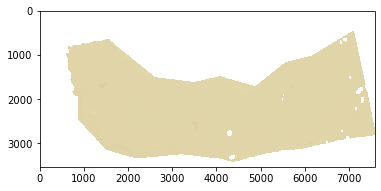

In [67]:
import rasterio
from matplotlib import pyplot
src = rasterio.open("diff-snowdepth.tif")
pyplot.imshow(src.read(1), cmap='pink',vmin=0,vmax=1)

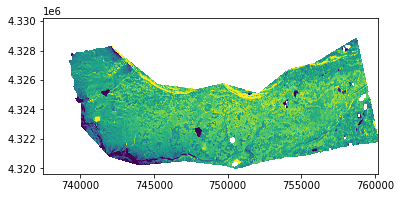

<AxesSubplot:>

In [70]:
show((src, 1), cmap='viridis',vmin=0,vmax=1)

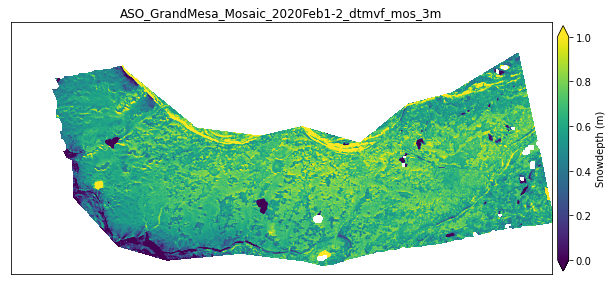

In [74]:
fig,ax = plt.subplots(figsize=(10,5))

cmap='viridis'
vmin = 0
vmax = 1
show(src, 
     ax=ax,
     cmap=cmap,
     vmin = vmin,
     vmax = vmax)

sm = plt.cm.ScalarMappable(cmap=cmap,
                               norm=plt.Normalize(vmin = vmin, 
                                                  vmax = vmax))
cbar = fig.colorbar(sm, 
                    ax=ax,
                    pad=0.01,
                    extend='both',
                    fraction=0.02)

cbar.set_label(label='Snowdepth (m)')

ax.set_xticks(())
ax.set_yticks(())

title = tif_files[0].split('/')[-1].split('.')[0]
ax.set_title(title);

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
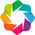

In [114]:
# Sample raster at a point
# set up and select a pit to work with
import pandas as pd

# import necessary libraries
import pandas as pd
import os
import glob
import geopandas   
# add lat.lon data
import utm  
import holoviews as hv

hv.extension('bokeh')
renderer = hv.renderer('bokeh')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
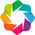

In [115]:
# set up and select a pit to work with
import pandas as pd

# import necessary libraries
import pandas as pd
import os
import glob
import geopandas   
# add lat.lon data
import utm  
import holoviews as hv

hv.extension('bokeh')
renderer = hv.renderer('bokeh')


# use glob to get all the csv files 
# in the folder
path = './PitDataTemperature/'
csv_files = glob.glob(os.path.join(path, "*.csv"))
complete_df = pd.DataFrame()
layer_df = pd.DataFrame()

def utm_to_latlon(coords, zone_number, zone_letter):
    easting = coords[0]
    northing = coords[1]
    return utm.to_latlon(easting, northing, zone_number, zone_letter)


  
#loop over the list of csv files
for f in csv_files:
    #print(f)
    df = pd.read_csv(f, header=None)
    dfdata = pd.read_csv(f, header = 13)
    # grab the metadata only
    dfmeta = df.head(12)
    # transpose the metadata to columns
    dftranspose = dfmeta.transpose().head(2)
    # grab column names from the first row
    newheader = dftranspose.iloc[0]
    # remove the column names row
    dftranspose = dftranspose[1:]

    # add column names to transposed metadata
    dftranspose.columns = newheader

    # duplicate rows of metadata to length of snow pit temperature profile
    # duplicate rows of metadata to length of snow pit temperature profile
    dfdup = dftranspose.reindex(dftranspose.index.repeat(len(dfdata))).reset_index(drop=True)
    
    # merge dfdata with dfdup to make a complete df of snow profile temps
    dfmerged = pd.concat([dfdup, dfdata], axis = 1)
    del dfmerged['Hs:'] # remove the total HS measurement column

    # create snow pit location geometry

    gdf = geopandas.GeoDataFrame(
    dfmerged, geometry=geopandas.points_from_xy(dfmerged['Easting:'], dfmerged['Northing:']))


    #complete_df = complete_df.append(Sitedf)
    layer_df = layer_df.append(dfmerged)
    # LayerData dataframe
    #print(dfreorder.head)

In [116]:
points = layer_df['geometry']

In [117]:
layer_df['sdaso'] = zonal_stats(
        vectors=layer_df['geometry'], 
        raster='diff-snowdepth.tif', 
        stats='mean'
    )

In [107]:
import numpy as np
import hvplot.pandas  # noqa
import hvplot.dask  # noqa

In [118]:
from datetime import datetime
layer_df['datetime'] = pd.to_datetime(layer_df['Time:'])
layer_df['doy']= layer_df['datetime'].dt.dayofyear

In [119]:
layer_df.head()

,Location:,Type:,Easting:,Northing:,Surveyor:,Time:,Time Type:,Air Temp:,Ground:,Notes:,Wx:,Hs,Temperature,Notes,geometry,Wx:,sdaso,datetime,doy
0,Skyway,Trees,754148,4325844,J. Lund,5/3/20 18:32,PM,3.2,"Smooth, grass ~10cm",No stratigraphy. I'm assuming I thought it wou...,"Partly cloudy, light breeze.",63,-0.2,NaN,POINT (754148.000 4325844.000),NaN,{'mean': 0.60595703125},2020-05-03 18:32:00,124
1,Skyway,Trees,754148,4325844,J. Lund,5/3/20 18:32,PM,3.2,"Smooth, grass ~10cm",No stratigraphy. I'm assuming I thought it wou...,"Partly cloudy, light breeze.",60,-0.2,NaN,POINT (754148.000 4325844.000),NaN,{'mean': 0.60595703125},2020-05-03 18:32:00,124
2,Skyway,Trees,754148,4325844,J. Lund,5/3/20 18:32,PM,3.2,"Smooth, grass ~10cm",No stratigraphy. I'm assuming I thought it wou...,"Partly cloudy, light breeze.",50,-0.2,NaN,POINT (754148.000 4325844.000),NaN,{'mean': 0.60595703125},2020-05-03 18:32:00,124
3,Skyway,Trees,754148,4325844,J. Lund,5/3/20 18:32,PM,3.2,"Smooth, grass ~10cm",No stratigraphy. I'm assuming I thought it wou...,"Partly cloudy, light breeze.",40,-0.2,NaN,POINT (754148.000 4325844.000),NaN,{'mean': 0.60595703125},2020-05-03 18:32:00,124
4,Skyway,Trees,754148,4325844,J. Lund,5/3/20 18:32,PM,3.2,"Smooth, grass ~10cm",No stratigraphy. I'm assuming I thought it wou...,"Partly cloudy, light breeze.",30,-0.2,NaN,POINT (754148.000 4325844.000),NaN,{'mean': 0.60595703125},2020-05-03 18:32:00,124


In [121]:
delay_max_ampm = layer_df.groupby(['doy',"Time Type:", 'Hs','Type:'])['Temperature'].max()

In [122]:
delay_max_ampm.hvplot(by=["Time Type:",'Type:'])

:NdOverlay   [Time Type:,Type:]
   :Curve   [doy]   (Temperature)

In [123]:
layer_df.hvplot(by=["Time Type:",'Type:'])

:NdOverlay   [Variable]
   :Curve   [index]   (value)